# Wine_Quality_Analysis

### Synthetic dataset to evaluate and predict the quality of wine

#### Description

This datasets is related to red variants of the Portuguese "Vinho Verde" wine. For more details, consult the reference [Cortez et al., 2009]. Due to privacy and logistic issues, only physicochemical (inputs) and sensory (the output) variables are available (e.g. there is no data about grape types, wine brand, wine selling price, etc.).

## 1. Import Libraries

In [178]:
#for data manipulation operations
import pandas as pd

In [179]:
#numeric operations
import numpy as np

In [180]:
import matplotlib.pyplot as plt
import seaborn as sns  #for data visualization operations

#for standardization and encoding
from sklearn.preprocessing import StandardScaler, LabelEncoder,  MinMaxScaler, RobustScaler 
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
%matplotlib inline

from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_auc_score, roc_curve

from sklearn import model_selection
from sklearn.svm import SVC
from sklearn.linear_model import SGDClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier

In [181]:
#!pip install pandas-profiling

In [182]:
#ignore warnings
import warnings
warnings.filterwarnings("ignore")

In [183]:
import pandas_profiling

In [1]:
#!pip install lightgbm

#### Import dataset

In [185]:
wine_df=pd.read_csv("winequality-red.csv")

## 2. Exploration of the Data

In [186]:
wine_df.head(5)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [17]:
wine_df.shape

(1599, 12)

In [18]:
wine_df.columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality'],
      dtype='object')

Dataframe: wine_df as loaded from the "Wine.QT.csv" file has data for the following features:
- fixed acidity 
- volatile acidity
- citric acid
- residual sugar
- chlorides
- free sulfur dioxide
- total sulfur dioxide
- density 
- pH
- sulphates
- alcohol
- quality
- Id

And 1143 inserted values

In [39]:
#Rename columns and omit spaces 
wine_df.rename(columns = {"fixed acidity": "fixed_acidity", "volatile acidity": "volatile_acidity",
                    "citric acid": "citric_acid", "residual sugar": "residual_sugar",
                    "chlorides": "chlorides", "free sulfur dioxide": "free_sulfur_dioxide",
                    "total sulfur dioxide": "total_sulfur_dioxide"}, inplace = True)

In [40]:
wine_df.describe().T

,count,mean,std,min,25%,50%,75%,max
fixed_acidity,1599.0,8.319637,1.741096,4.60000,7.1000,7.90000,9.200000,15.90000
volatile_acidity,1599.0,0.527821,0.179060,0.12000,0.3900,0.52000,0.640000,1.58000
citric_acid,1599.0,0.270976,0.194801,0.00000,0.0900,0.26000,0.420000,1.00000
residual_sugar,1599.0,2.538806,1.409928,0.90000,1.9000,2.20000,2.600000,15.50000
chlorides,1599.0,0.087467,0.047065,0.01200,0.0700,0.07900,0.090000,0.61100
free_sulfur_dioxide,1599.0,15.874922,10.460157,1.00000,7.0000,14.00000,21.000000,72.00000
total_sulfur_dioxide,1599.0,46.467792,32.895324,6.00000,22.0000,38.00000,62.000000,289.00000
density,1599.0,0.996747,0.001887,0.99007,0.9956,0.99675,0.997835,1.00369
pH,1599.0,3.311113,0.154386,2.74000,3.2100,3.31000,3.400000,4.01000
sulphates,1599.0,0.658149,0.169507,0.33000,0.5500,0.62000,0.730000,2.00000


- The average value of fixed acidity is 8.31, the highest value is 15.9
- The average value of volatile acidity is 0.52, the highest value is 1.58
- The average value of citric acid is 0.27, the highest value is 1
- The average value of residual sugar is 2.53, the highest value is 15.5
- The average value of chlorides is 0.08, the highest value is 0.61
- The average value of free sulfur dioxide is 15.87, the highest value is 72
- The average value of total sulfur dioxide is 46.46, the highest value is 289
- The average value of density is 0.99, the highest value is 1
- The average value of pH is 3.31, the highest value is 4.01
- The average value of sulphates is 0.65, the highest value is 2
- The average value of alcohol is 10.42, the highest value is 14.90
- The average value of quality is 5.63, the highest value is 8

In [41]:
wine_df.dtypes

fixed_acidity           float64
volatile_acidity        float64
citric_acid             float64
residual_sugar          float64
chlorides               float64
free_sulfur_dioxide     float64
total_sulfur_dioxide    float64
density                 float64
pH                      float64
sulphates               float64
alcohol                 float64
quality                   int64
dtype: object

* Check if there are duplicated in id insertion to eliminate the duplicates

In [42]:
wine_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed_acidity         1599 non-null   float64
 1   volatile_acidity      1599 non-null   float64
 2   citric_acid           1599 non-null   float64
 3   residual_sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free_sulfur_dioxide   1599 non-null   float64
 6   total_sulfur_dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


In [43]:
#Evaluate the presence of null values
print("Totally there are {} null values in the dataset".format(wine_df.isnull().sum().sum()))


Totally there are 0 null values in the dataset


## 3. Data Visualisation

In [35]:
profiling = pandas_profiling.ProfileReport(wine_df)
profiling

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Another way to visualise the data can be done with seaborn.

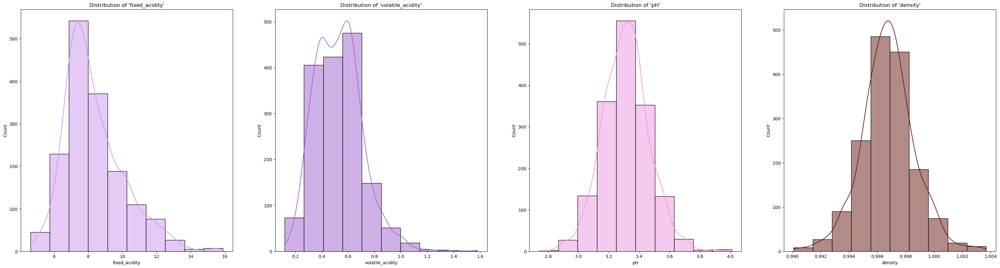

In [59]:
fig, axes = plt.subplots(1, 4, figsize = (40, 10))

sns.histplot(ax = axes[0], x = wine_df["fixed_acidity"],
             bins = 10,
             kde = True,
             cbar = True,
             color = "#CA96EC").set(title = "Distribution of 'fixed_acidity'");

sns.histplot(ax = axes[1], x = wine_df["volatile_acidity"],
             bins = 10,
             cbar = True,
             kde = True,
             color = "#A163CF").set(title = "Distribution of 'volatile_acidity'");

sns.histplot(ax = axes[2], x = wine_df["pH"],
             bins = 10,
             kde = True,   
             cbar = True,
             color = "#EC96E0").set(title = "Distribution of 'pH'");

sns.histplot(ax = axes[3], x = wine_df["density"],
             bins = 10,    
             kde = True,
             cbar = True,
             color = "#641811").set(title = "Distribution of 'density'");



- Analysing the graphs here: Fixed acitidy, pH, density and volatile acidity of the wine have a normal distribution. With volatile acidity to be slidly skewed on the left. 

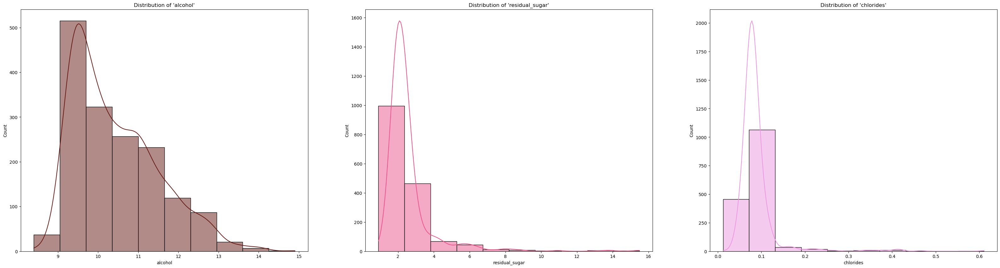

In [49]:
fig, axes = plt.subplots(1, 3, figsize=(40, 10))

sns.histplot(ax = axes[0], x = wine_df["alcohol"],
             bins = 10,    
             kde = True,
             cbar = True,
             color = "#641811").set(title = "Distribution of 'alcohol'");

sns.histplot(ax = axes[1], x = wine_df["residual_sugar"],
             bins = 10,
             kde = True,
             cbar = True,
             color = "#EB548C").set(title = "Distribution of 'residual_sugar'");

sns.histplot(ax = axes[2], x = wine_df["chlorides"],
             bins = 10,
             kde = True,   
             cbar = True,
             color = "#EC96E0").set(title = "Distribution of 'chlorides'");


[Text(0.5, 1.0, "Distribution of 'citric_acid'")]

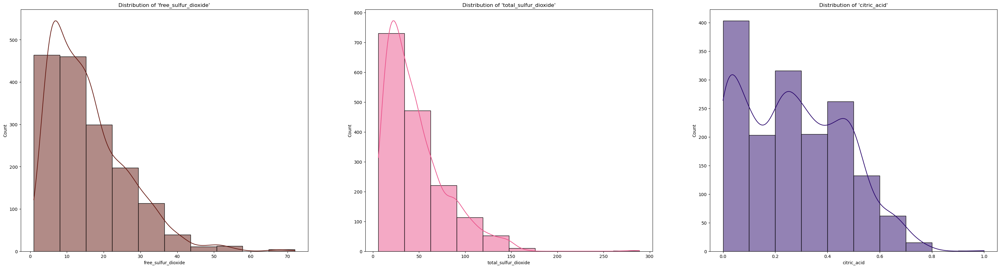

In [54]:
fig, axes = plt.subplots(1, 3, figsize=(40, 10))

sns.histplot(ax = axes[0], x = wine_df["free_sulfur_dioxide"],
             bins = 10,    
             kde = True,
             cbar = True,
             color = "#641811").set(title = "Distribution of 'free_sulfur_dioxide'");

sns.histplot(ax = axes[1], x = wine_df["total_sulfur_dioxide"],
             bins = 10,
             kde = True,
             cbar = True,
             color = "#EB548C").set(title = "Distribution of 'total_sulfur_dioxide'");

sns.histplot(ax = axes[2], x = wine_df["citric_acid"],
             bins = 10,
             kde = True,   
             cbar = True,
             color = "#29066B").set(title = "Distribution of 'citric_acid'")


[Text(0.5, 1.0, "Distribution of 'quality'")]

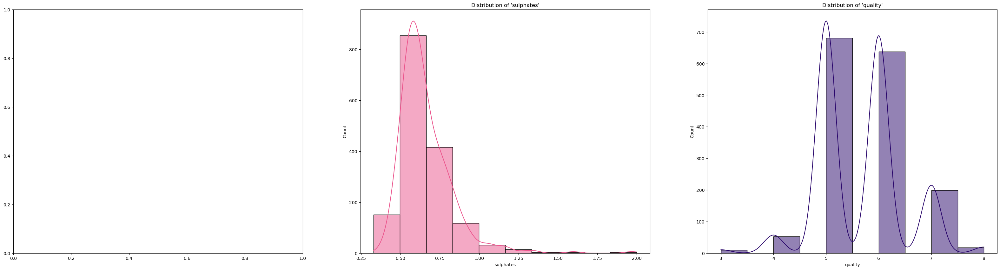

In [62]:
fig, axes = plt.subplots(1, 3, figsize=(40, 10))


sns.histplot(ax = axes[1], x = wine_df["sulphates"],
             bins = 10,
             kde = True,
             cbar = True,
             color = "#EB548C").set(title = "Distribution of 'sulphates'");

sns.histplot(ax = axes[2], x = wine_df["quality"],
             bins = 10,
             kde = True,   
             cbar = True,
             color = "#29066B").set(title = "Distribution of 'quality'")


- Alcochol, residual sugar, chlorides, free_sulfur_dioxide, total_sulfur_dioxide, sulphates and citric_acid do not have a nornal distribution.

In [100]:
#Kurtosis of normal distribution =0
wine_df.kurtosis()

fixed_acidity            1.132143
volatile_acidity         1.225542
citric_acid             -0.788998
residual_sugar          28.617595
chlorides               41.715787
free_sulfur_dioxide      2.023562
total_sulfur_dioxide     3.809824
density                  0.934079
pH                       0.806943
sulphates               11.720251
alcohol                  0.200029
quality                  0.296708
dtype: float64

1. Most of the values ​​of the "fixed_acidity" variable are in the range of 7 - 8;
2. Most of the values ​​of the "volatile_acidity" variable are in the range of 0.4 - 0.7;
3. Most values ​​of the "citric_acid" variable are in the range of 0.0 - 0.1;
4. Most of the values ​​of the "residual_sugar" variable are in the range of 1 - 2.5;
5. Most of the values ​​of the "chlorides" variable are in the range of 0.085 - 0.15;
6. Most values ​​of the "free_sulfur_dioxide" variable are in the range 0 - 15;
7. Most values ​​of the "total_sulfur_dioxide" variable are in the range 0 - 30;
8. Most of the values ​​of the "density" variable are in the range of 0.996 - 0.998;
9. Most of the values ​​of the "pH" variable are in the range of 3.2 - 3.4;
10. Most of the values ​​of the "sulphates" variable are in the range of 0.50 - 0.75;
11. Most of the values ​​of the "alcohol" variable are in the range of 9 - 10;
12. Most values ​​of the "quality" variable are 5 and 6.

In [64]:
#Pairplot: showing the relationships between each feature
sns.pairplot(wine_df, diag_kind = "hist", hue = "quality", height = 3, aspect = 1.2, corner = True);

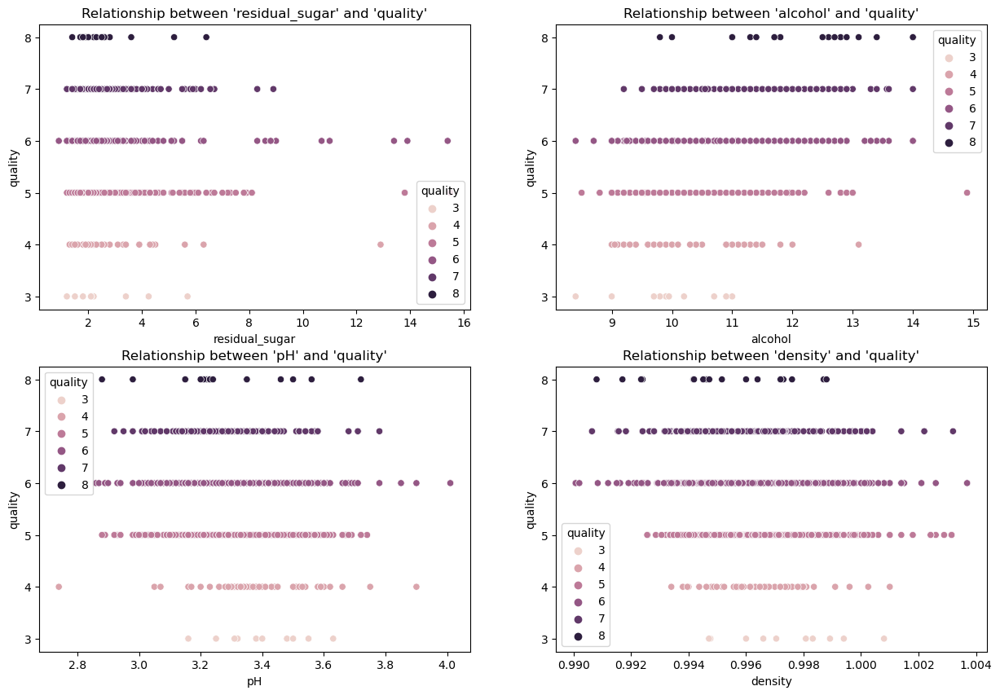

In [66]:
#Plot scatterplot with plots that are more correlated with the wine quality
fig, axes = plt.subplots(2, 2, figsize=(15, 10))
axes = axes.flatten()

sns.scatterplot(ax = axes[0],
                x = "residual_sugar",
                y = "quality", hue = "quality",
                data = wine_df).set(title = "Relationship between 'residual_sugar' and 'quality'");

sns.scatterplot(ax = axes[1],
                x = "alcohol",
                y = "quality", hue = "quality",
                data = wine_df).set(title = "Relationship between 'alcohol' and 'quality'");

sns.scatterplot(ax = axes[2],
                x = "pH",
                y = "quality", hue = "quality",
                data = wine_df).set(title = "Relationship between 'pH' and 'quality'");

sns.scatterplot(ax = axes[3],
                x = "density",
                y = "quality", hue = "quality",
                data = wine_df).set(title = "Relationship between 'density' and 'quality'");


- Low residual sugars levels (1-4) are correlated with higher wine quality
- However alcochol, ph and density are not clear of they are correlated with the wine quality

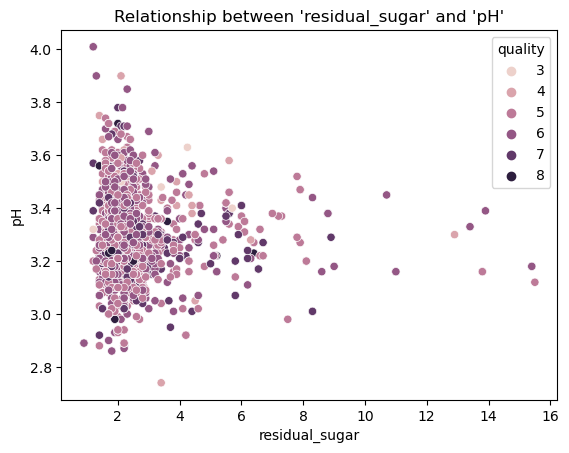

In [68]:
sns.scatterplot(x = "residual_sugar",
                y = "pH",
                hue = "quality",
                data = wine_df).set(title = "Relationship between 'residual_sugar' and 'pH'");

-As it can be seen there is not correlation between 'residual_sugar' and 'pH' variables

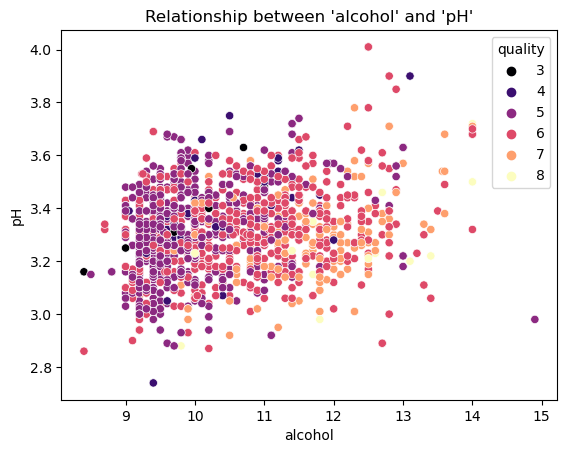

In [69]:
sns.scatterplot(x = "alcohol",
                y = "pH",
                hue = "quality",
                palette = "magma",
                data = wine_df).set(title = "Relationship between 'alcohol' and 'pH'");

-There is not correlation between 'alcohol' and 'pH' variables

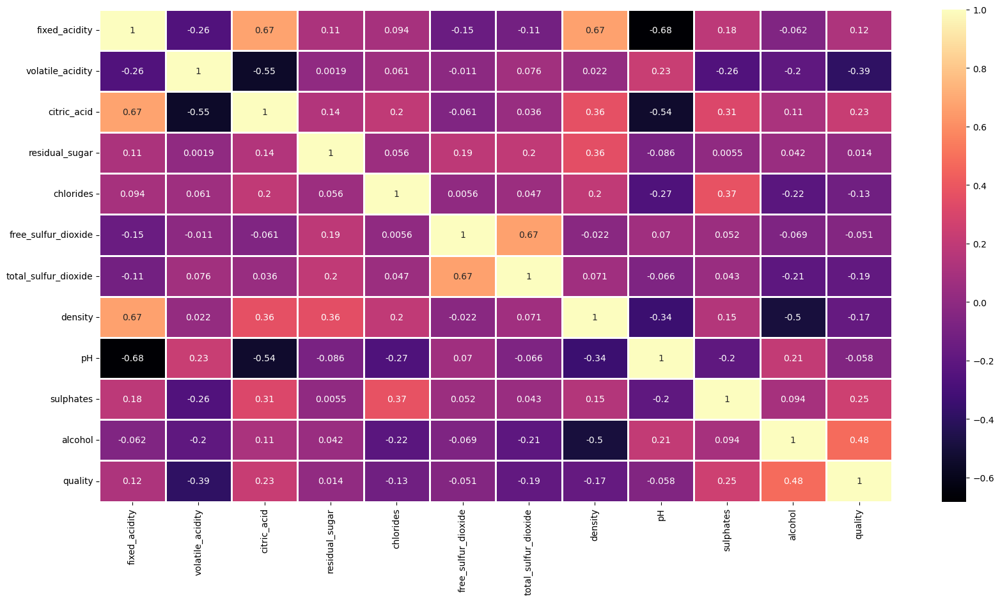

In [71]:
plt.figure(figsize = [20, 10], facecolor = 'white')
sns.heatmap(wine_df.corr(), annot = True, linewidths = 2, cmap = "magma");

<Axes: xlabel='volatile_acidity', ylabel='Count'>

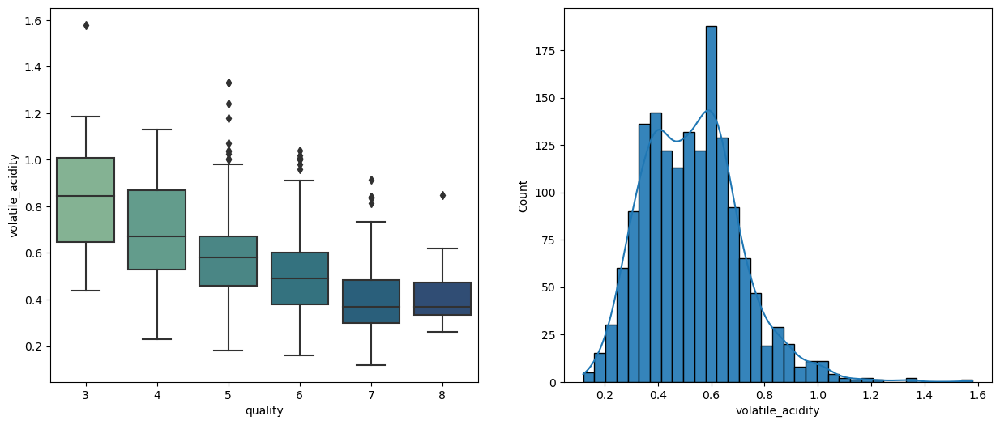

In [94]:
fig, ax = plt.subplots(1, 2, figsize=(15, 6))

sns.boxplot(x='quality', y='volatile_acidity', data=wine_df, palette="crest", ax=ax[0])
sns.histplot(wine_df['volatile_acidity'], kde=True, alpha=0.9, ax=ax[1])

- Violatile acitidy has negative corralation with wine quality, with density and total_sufur_dioxide correlated in less but negative correlation as the same time with qiality

Text(0.5, 0.98, 'The more citric acid, the better quality')

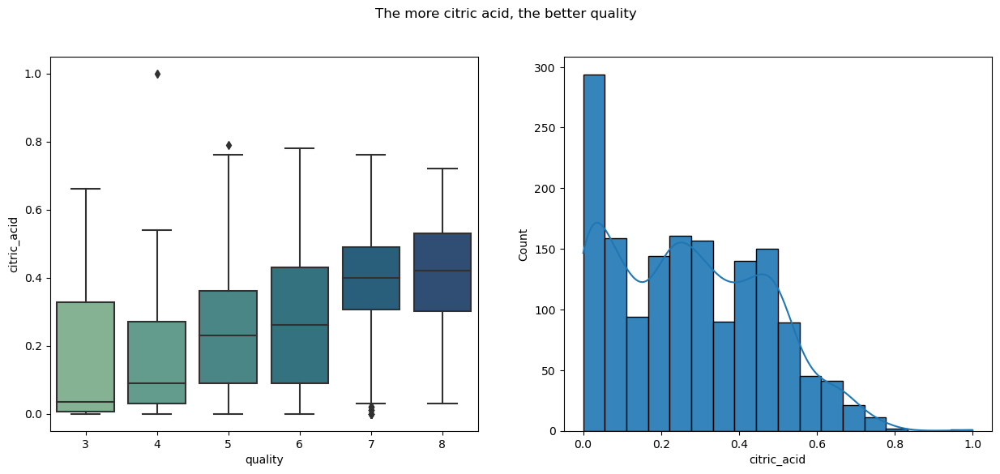

In [96]:
fig, ax = plt.subplots(1, 2, figsize=(15, 6))

sns.boxplot(x='quality', y='citric_acid', data=wine_df, palette="crest", ax=ax[0])
sns.histplot(wine_df['citric_acid'], kde=True, alpha=0.9, ax=ax[1])

fig.suptitle('The more citric acid, the better quality')


Text(0.5, 0.98, 'The more alcohol, the better quality')

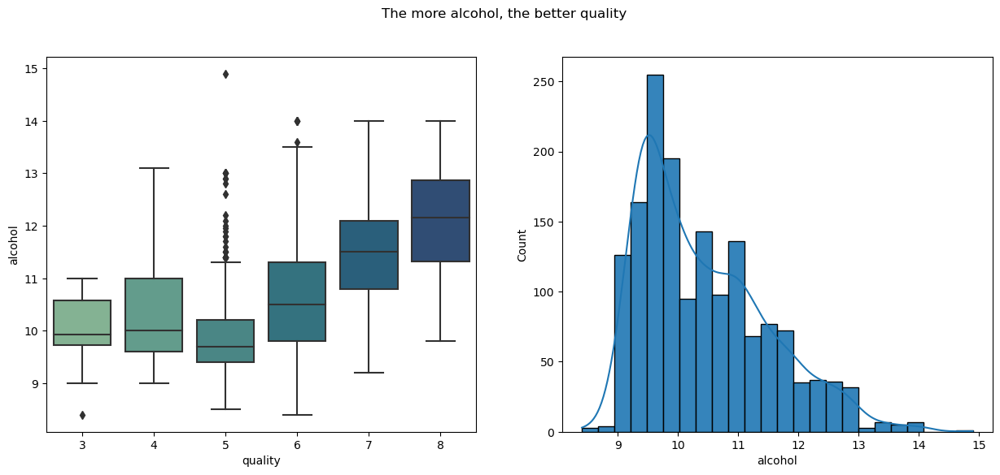

In [98]:
fig, ax = plt.subplots(1, 2, figsize=(15, 6))

sns.boxplot(x='quality', y='alcohol', data=wine_df, palette="crest", ax=ax[0])
sns.histplot(wine_df['alcohol'], kde=True, alpha=0.9, ax=ax[1])

fig.suptitle('The more alcohol, the better quality')

- With this order 1)alcochol, 2)sulphates, 3) citric acid and 4) fixed acidity are positively correlated with the wine quantity

## 4. Pre-processing and Data Classification

In [214]:
#Slect the dependent and indepedent variables and split data into test and train
y = wine_df["quality"]
X = wine_df.drop("quality", axis = 1) #indendent

In [215]:
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size = 0.25,
                                                    shuffle = True,
                                                    random_state = 2)

In [216]:
X_train.shape

(1199, 11)

In [217]:
X_test.shape

(400, 11)

In [218]:
y_train.shape

(1199,)

In [219]:
y_test.shape

(400,)

#### Normalisation of data
Standardizing the features around the center and 0 with a standard deviation of 1 is important when we compare measurements that have different units. Variables that are measured at different scales do not contribute equally to the analysis and might end up creating a bais. For example, a variable that ranges between 0 and 1000 will outweigh a variable that ranges between 0 and 1. Using these variables without standardization will give the variable with the larger range weight of 1000 in the analysis. Transforming the data to comparable scales can prevent this problem. Typical data standardization procedures equalize the range and/or data variability.

But we will not use 'StandardScaler', because our dataset is not normally distributed. We will use 'MinMaxScaler' for normalizing this dataset. It transforms features by scaling each feature to a given range. This estimator scales and translates each feature individually such that it is in the given range on the training set, e.g. between 0 and 1.

In [246]:
norm = MinMaxScaler(feature_range = (0, 1))
norm.fit(X_train)
X_train = norm.transform(X_train)
X_test = norm.transform(X_test)

In [247]:
X_train.shape



(1199, 11)

In [248]:
y_test.shape

(400,)

In [249]:
y_train.shape

(1199,)

In [250]:
X_test.shape

(400, 11)

## 5. Machine Learning and CrossValidation

• Use different classifiers model to evaluate the best model based on their accuracy

In [245]:
rfc = RandomForestClassifier(n_estimators=200)
rfc.fit(X_train, y_train)


RandomForestClassifier(n_estimators=200)

In [141]:
pred_rfc = rfc.predict(X_test)

In [142]:
#How random forest classifier model performed
print(classification_report(y_test, pred_rfc))

              precision    recall  f1-score   support

           3       0.00      0.00      0.00         1
           4       0.00      0.00      0.00        13
           5       0.64      0.78      0.70       148
           6       0.69      0.66      0.68       185
           7       0.62      0.52      0.57        48
           8       0.50      0.20      0.29         5

    accuracy                           0.66       400
   macro avg       0.41      0.36      0.37       400
weighted avg       0.64      0.66      0.64       400



In [147]:
pred_rfc.shape
pred_rfc

array([6, 6, 6, 5, 5, 5, 6, 5, 5, 5, 6, 7, 5, 6, 5, 7, 6, 7, 6, 6, 6, 6,
       6, 6, 5, 6, 5, 6, 7, 6, 5, 6, 6, 7, 6, 5, 6, 6, 6, 6, 5, 7, 6, 5,
       5, 6, 5, 6, 6, 5, 5, 5, 5, 7, 6, 5, 6, 5, 6, 6, 6, 6, 5, 5, 6, 6,
       7, 7, 6, 6, 5, 6, 6, 5, 5, 6, 6, 5, 6, 5, 5, 6, 7, 5, 7, 6, 5, 5,
       5, 5, 6, 5, 5, 6, 5, 6, 5, 5, 5, 5, 6, 5, 5, 5, 6, 6, 6, 6, 6, 6,
       7, 5, 5, 5, 6, 6, 5, 6, 6, 6, 5, 5, 6, 6, 6, 5, 7, 6, 6, 5, 5, 5,
       7, 6, 6, 5, 6, 5, 5, 7, 6, 6, 6, 6, 5, 6, 6, 6, 6, 6, 5, 6, 6, 5,
       6, 6, 6, 5, 6, 5, 5, 5, 5, 5, 6, 7, 7, 6, 5, 5, 6, 6, 7, 6, 6, 6,
       5, 6, 5, 6, 5, 6, 5, 6, 5, 5, 6, 5, 6, 6, 5, 6, 5, 5, 5, 5, 5, 5,
       5, 7, 5, 6, 5, 5, 5, 5, 6, 7, 6, 5, 7, 6, 5, 5, 7, 6, 6, 6, 5, 6,
       6, 6, 5, 6, 6, 5, 5, 6, 6, 6, 6, 5, 5, 5, 6, 5, 5, 6, 5, 5, 7, 5,
       6, 8, 6, 7, 5, 6, 5, 7, 5, 5, 5, 5, 7, 5, 5, 5, 6, 5, 6, 5, 5, 5,
       6, 6, 5, 5, 5, 6, 5, 6, 5, 6, 5, 5, 5, 5, 6, 5, 5, 6, 5, 6, 5, 5,
       5, 6, 6, 7, 7, 6, 5, 5, 5, 5, 8, 5, 5, 6, 7,

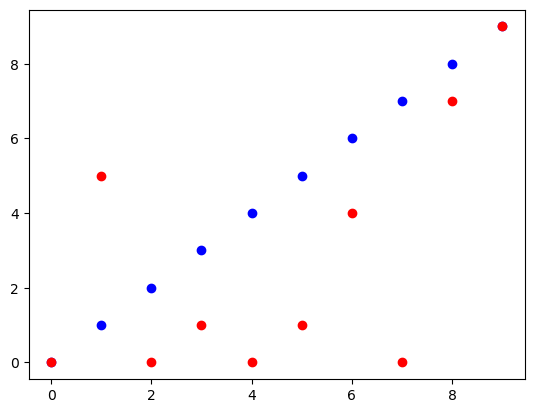

In [156]:
def plotGraph(y_test,pred_rfc):
    if max(y_test) >= max(pred_rfc):
        my_range = int(max(y_test))
    else:
        my_range = int(max(pred_rfc))
    plt.scatter(range(len(y_test)), y_test, color='blue')
    plt.scatter(range(len(pred_rfc)), pred_rfc, color='red')
    plt.show()
    return


y_test = range(10)
pred_rfc = np.random.randint(0, 10, 10)

plotGraph(y_test, pred_rfc)

* Prediction values don't represent the y_test values.
* The accuracy is low, thus we will use another classification algoriths

#### K-Nearest Neighbors (KNN) Model

* In statistics, the k-nearest neighbors algorithm (k-NN) is a non-parametric supervised learning method. 
* It is used for classification and regression. 
* The input consists of the k closest training examples in a data set. 
* The output depends on whether k-NN is used for classification or regression.

* In k-NN classification, the output is a class membership. An object is classified by a plurality vote of its neighbors, with the object being assigned to the class most common among its k nearest neighbors (k is a positive integer, typically small). If k = 1, then the object is simply assigned to the class of that single nearest neighbor.

* In k-NN regression, the output is the property value for the object. This value is the average of the values of k nearest neighbors.

* k-NN is a type of classification where the function is only approximated locally and all computation is deferred until function evaluation. 
* Since this algorithm relies on distance for classification, if the features represent different physical units or come in vastly different scales then normalizing the training data can improve its accuracy dramatically.

* Both for classification and regression, a useful technique can be to assign weights to the contributions of the neighbors, so that the nearer neighbors contribute more to the average than the more distant ones. 

* The neighbors are taken from a set of objects for which the class (for k-NN classification) or the object property value (for k-NN regression) is known. 
* This can be thought of as the training set for the algorithm, though no explicit training step is required.

* A peculiarity of the k-NN algorithm is that it is sensitive to the local structure of the data.

In [198]:
knn = KNeighborsClassifier()

In [199]:
knn_params = {"n_neighbors": np.arange(2, 50),
             "weights": ["uniform", "distance"],
             "leaf_size": [25, 30, 25]}

knn_cv_model = GridSearchCV(knn, knn_params, cv = 10)


In [200]:
knn_cv_model.fit(X_train, y_train)

GridSearchCV(cv=10, estimator=KNeighborsClassifier(),
             param_grid={'leaf_size': [25, 30, 25],
                         'n_neighbors': array([ 2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18,
       19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35,
       36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]),
                         'weights': ['uniform', 'distance']})

In [201]:
#choose the best parameters for the k-NN model
print("Best score for train set: " + str(knn_cv_model.best_score_))

print("____________________________________________")

print("best K value: " + str(knn_cv_model.best_params_["n_neighbors"]),
     "\nbest weights: " + knn_cv_model.best_params_["weights"],
     "\nbest leaf size: " + str(knn_cv_model.best_params_["leaf_size"]))


Best score for train set: 0.6739145658263305
____________________________________________
best K value: 25 
best weights: distance 
best leaf size: 25


In [202]:
#Build the k-NN model with the above - best parameters
knn_model = KNeighborsClassifier(n_neighbors = knn_cv_model.best_params_["n_neighbors"],
                                leaf_size = knn_cv_model.best_params_["leaf_size"],
                                weights = knn_cv_model.best_params_["weights"])

knn_model.fit(X_train, y_train)

KNeighborsClassifier(leaf_size=25, n_neighbors=25, weights='distance')

In [203]:
#Find the accuracy score for the new k-NN model
y_pred = knn_model.predict(X_test)
y_pred

array([6, 6, 6, 5, 5, 6, 6, 5, 5, 5, 6, 7, 5, 6, 5, 7, 6, 6, 6, 6, 5, 5,
       5, 6, 5, 7, 5, 7, 6, 5, 5, 6, 5, 7, 6, 5, 6, 6, 6, 6, 5, 7, 6, 5,
       5, 6, 5, 6, 6, 5, 5, 5, 5, 7, 6, 5, 5, 5, 6, 6, 6, 6, 6, 6, 5, 6,
       7, 7, 6, 6, 5, 5, 6, 5, 5, 6, 6, 6, 6, 5, 5, 6, 7, 6, 7, 6, 6, 5,
       5, 5, 6, 5, 5, 6, 6, 5, 5, 5, 5, 5, 6, 5, 5, 5, 6, 6, 6, 6, 6, 5,
       7, 5, 5, 5, 6, 6, 5, 6, 6, 6, 5, 6, 5, 6, 7, 5, 6, 7, 6, 5, 7, 5,
       7, 6, 6, 5, 6, 6, 5, 7, 6, 6, 6, 6, 6, 5, 6, 6, 6, 6, 5, 6, 6, 5,
       6, 6, 6, 5, 6, 6, 5, 5, 5, 5, 6, 6, 6, 6, 5, 5, 6, 6, 7, 6, 6, 7,
       5, 6, 5, 6, 5, 6, 5, 6, 5, 6, 6, 5, 6, 6, 5, 5, 5, 5, 5, 5, 5, 5,
       5, 7, 5, 5, 5, 6, 5, 5, 6, 7, 6, 5, 7, 6, 6, 6, 7, 6, 6, 5, 5, 6,
       6, 6, 5, 6, 6, 6, 5, 6, 6, 6, 6, 5, 5, 5, 6, 5, 5, 6, 5, 5, 7, 5,
       5, 8, 6, 6, 5, 6, 5, 7, 5, 5, 6, 5, 7, 7, 5, 5, 6, 5, 6, 6, 5, 5,
       6, 6, 5, 5, 5, 6, 5, 5, 5, 7, 5, 5, 6, 5, 6, 5, 6, 6, 5, 6, 6, 5,
       5, 6, 7, 7, 7, 7, 5, 5, 5, 5, 7, 6, 5, 5, 7,

In [204]:
y_pred.shape

(400,)

In [205]:
y_test.shape

(400,)

In [206]:
accuracy_score(y_test, y_pred)

0.6675

The Accuracy of k-NN is 66.75%

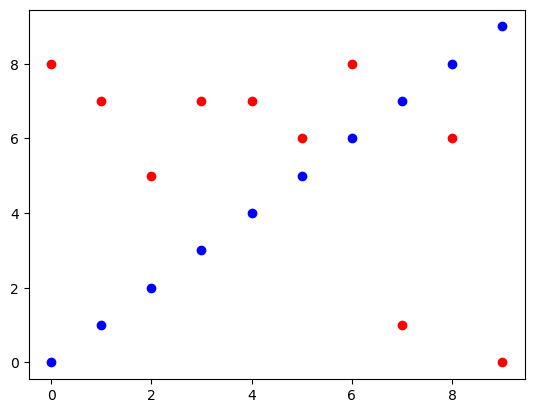

In [207]:
def plotGraph(y_test,y_pred):
    if max(y_test) >= max(y_pred):
        my_range = int(max(y_test))
    else:
        my_range = int(max(y_pred))
    plt.scatter(range(len(y_test)), y_test, color='blue')
    plt.scatter(range(len(y_pred)), y_pred, color='red')
    plt.show()
    return


y_test = range(10)
pred_rfc = np.random.randint(0, 10, 10)

plotGraph(y_test, pred_rfc)

* Predicted values are still diverging from the test values

### Use Gradient Boosting Machines (GBM) model 
Use this model to increase the accuracy of the analysis and the improve the model with the predicted values

* Gradient boosting is a machine learning technique used in regression and classification tasks, among others. 
* It gives a prediction model in the form of an ensemble of weak prediction models, which are typically decision trees. 
* When a decision tree is the weak learner, the resulting algorithm is called gradient-boosted trees; it usually outperforms random forest. 
* A gradient-boosted trees model is built in a stage-wise fashion as in other boosting methods, but it generalizes the other methods by allowing optimization of an arbitrary differentiable loss function.

In [208]:
gbm = GradientBoostingClassifier()

In [210]:
gbm_params = {"learning_rate": [0.005, 0.008, 0.1, 0.15],
              "n_estimators": [80, 100, 150, 200],
              "max_depth": [2, 3, 4],
              "min_samples_split": [2, 3, 4]}

gbm_cv_model = GridSearchCV(gbm, gbm_params, cv = 10, n_jobs = -1)
gbm_cv_model.fit(X_train, y_train)

GridSearchCV(cv=10, estimator=GradientBoostingClassifier(), n_jobs=-1,
             param_grid={'learning_rate': [0.005, 0.008, 0.1, 0.15],
                         'max_depth': [2, 3, 4], 'min_samples_split': [2, 3, 4],
                         'n_estimators': [80, 100, 150, 200]})

In [211]:
# Evaluate the best arameters for this model
print("Best score for train set: " + str(gbm_cv_model.best_score_))

print("__________________________________________________________")

print("best learning_rate value: " + str(gbm_cv_model.best_params_["learning_rate"]),
     "\nbest n_estimators value: " + str(gbm_cv_model.best_params_["n_estimators"]),
     "\nbest max_depth value: " + str(gbm_cv_model.best_params_["max_depth"]),
     "\nbest min_samples_split value: " + str(gbm_cv_model.best_params_["min_samples_split"]))


Best score for train set: 0.6855812324929972
__________________________________________________________
best learning_rate value: 0.1 
best n_estimators value: 200 
best max_depth value: 4 
best min_samples_split value: 3


In [251]:
#Fit the model with the best parameters:
gbm = GradientBoostingClassifier(learning_rate = gbm_cv_model.best_params_["learning_rate"],
                                 max_depth = gbm_cv_model.best_params_["max_depth"],
                                 n_estimators = gbm_cv_model.best_params_["n_estimators"],
                                 min_samples_split = gbm_cv_model.best_params_["min_samples_split"])


In [265]:
gbm_model = gbm.fit(X_train, y_train)

In [266]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           3       0.00      0.00      0.00         1
           4       0.00      0.00      0.00        13
           5       0.63      0.76      0.69       148
           6       0.71      0.67      0.69       185
           7       0.63      0.60      0.62        48
           8       1.00      0.20      0.33         5

    accuracy                           0.67       400
   macro avg       0.50      0.37      0.39       400
weighted avg       0.65      0.67      0.65       400



In [254]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier




In [255]:
#Creating a dictionary using a for loop for class weights
class_weight = {}

for i in range(len(np.unique(wine_df))):
    #for x in [np.around((len(targets[targets==i]))/(targets.shape[0]),4)]     #Actual Weights
    
    for x in [1/len(np.unique(wine_df))]:               #Since we want equal weights to be given to classes
        class_weight[i] = x
        
print('=== CLASS WEIGHT ===')
print(class_weight)


=== CLASS WEIGHT ===
{0: 0.0008818342151675485, 1: 0.0008818342151675485, 2: 0.0008818342151675485, 3: 0.0008818342151675485, 4: 0.0008818342151675485, 5: 0.0008818342151675485, 6: 0.0008818342151675485, 7: 0.0008818342151675485, 8: 0.0008818342151675485, 9: 0.0008818342151675485, 10: 0.0008818342151675485, 11: 0.0008818342151675485, 12: 0.0008818342151675485, 13: 0.0008818342151675485, 14: 0.0008818342151675485, 15: 0.0008818342151675485, 16: 0.0008818342151675485, 17: 0.0008818342151675485, 18: 0.0008818342151675485, 19: 0.0008818342151675485, 20: 0.0008818342151675485, 21: 0.0008818342151675485, 22: 0.0008818342151675485, 23: 0.0008818342151675485, 24: 0.0008818342151675485, 25: 0.0008818342151675485, 26: 0.0008818342151675485, 27: 0.0008818342151675485, 28: 0.0008818342151675485, 29: 0.0008818342151675485, 30: 0.0008818342151675485, 31: 0.0008818342151675485, 32: 0.0008818342151675485, 33: 0.0008818342151675485, 34: 0.0008818342151675485, 35: 0.0008818342151675485, 36: 0.0008818342

In [256]:
names = ['Logistic Regression', "KNN", "Linear SVM","Gradient Boosting", "Decision Tree", "Random_Forest"]
classifiers = [
    LogisticRegression(solver='liblinear', class_weight = class_weight, random_state=42),
    KNeighborsClassifier(n_neighbors=3, weights= 'distance'),
    SVC(kernel="linear", C=0.025, class_weight=class_weight, random_state=42),
    GradientBoostingClassifier(n_estimators=100, random_state=42),
    DecisionTreeClassifier(max_depth=5, class_weight=class_weight, random_state=42),
    RandomForestClassifier(max_depth=5, n_estimators=100, class_weight=class_weight, random_state=42)]


In [257]:
scores = []
for name, clf in zip(names, classifiers):
    clf.fit(X_train, y_train)
    score = clf.score(X_test, y_test)
    scores.append(score)
scores_df = pd.DataFrame()
scores_df['name'] = names
scores_df['score'] = np.around(scores,5)
scores_df.sort_values('score', ascending= False)

,name,score
1,KNN,0.6275
3,Gradient Boosting,0.6250
5,Random_Forest,0.5975
4,Decision Tree,0.5400
0,Logistic Regression,0.3775
2,Linear SVM,0.3700


* From the classification tests, the best model until now is the k-NN model as it has been optimised with the best parameters

## 6. Conclusions

* Wine quantity is strongly correlated with the aclochol, citric acid and violate acitidy
* Customers should focus on thee aspects to choose the best wine quality

However, more optimisation should be done to increase the accuracy model of the models